In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from io import BytesIO
import os

sys.path.insert(0, "C:/studyspace/PBL/libs")
from feature_extractor import FeatureExtractor

In [2]:
def read_binary_file(path: str):
    """Reading binary file by specified path

    Args:
        path (str): where file requiring read is located

    Returns:
        Byte version of the file
    """
    with open(path, 'rb') as f:
        return f.read()

In [3]:
feature_extractor = FeatureExtractor()

# lowest left corner point
low_x_threshold = -122.52
low_y_threshold =  36.65

# highest right corner point
high_x_threshold = -122.36
high_y_threshold =  40

In [7]:
train_df = pd.read_csv(BytesIO(read_binary_file(os.getcwd() + '\\data\\train.csv.zip')), compression='zip')
test_df = pd.read_csv(BytesIO(read_binary_file(os.getcwd() + '\\data\\test.csv.zip')), compression='zip')
print(train_df.shape)
print(test_df.shape)

(878049, 9)
(884262, 7)


In [8]:
train_df.head(5)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [6]:
train_df.tail(5)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-122.459033,37.714056
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-122.447364,37.731948
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,-122.403390,37.780266
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,-122.390531,37.780607
878048,2003-01-06 00:01:00,FORGERY/COUNTERFEITING,"CHECKS, FORGERY (FELONY)",Monday,BAYVIEW,NONE,1800 Block of NEWCOMB AV,-122.394926,37.738212


In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       878049 non-null  object 
 1   Category    878049 non-null  object 
 2   Descript    878049 non-null  object 
 3   DayOfWeek   878049 non-null  object 
 4   PdDistrict  878049 non-null  object 
 5   Resolution  878049 non-null  object 
 6   Address     878049 non-null  object 
 7   X           878049 non-null  float64
 8   Y           878049 non-null  float64
dtypes: float64(2), object(7)
memory usage: 60.3+ MB


In [8]:
test_df.shape

(884262, 7)

In [9]:
test_df.head(5)

,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [9]:
# remove locational outliers
train_df = feature_extractor.get_outlier_removed_col(train_df, 'Y', 
                up_threshold=high_y_threshold, low_threshold=low_y_threshold)
train_df = feature_extractor.get_outlier_removed_col(train_df, 'X', 
                up_threshold=high_x_threshold, low_threshold=low_x_threshold)

# remove data duplicates
train_df.drop_duplicates(inplace=True)

# remove unnecessary columns
train_df.drop(columns=['Resolution', 'Descript'], inplace=True)

In [10]:
# form time columns extracted from string-formatted timestamps
train_df = feature_extractor.make_time_cols(train_df, 'Dates')
test_df =  feature_extractor.make_time_cols(test_df,  'Dates')

# make new column that transforms weekdays from string-formatted records in numerical ones
train_df = feature_extractor.make_weekday_to_num(train_df, 'DayOfWeek')
test_df =  feature_extractor.make_weekday_to_num(test_df, 'DayOfWeek')

# form seasons basing on months
train_df = feature_extractor.make_seasons_col(train_df, "Month")
test_df =  feature_extractor.make_seasons_col(test_df, "Month")

In [11]:
# make harmonic variables that will be necessary for performing effective analysis of periodic features
train_df['harmonicHourX'], train_df['harmonicHourY'] = feature_extractor.get_harmonic_tuple(train_df['Hour'])
train_df['harmonicMinuteX'], train_df['harmonicMinuteY'] = feature_extractor.get_harmonic_tuple(train_df['Minute'])
train_df['harmonicWeekdayX'], train_df['harmonicWeekdayY'] = feature_extractor.get_harmonic_tuple(train_df['weekdayNumerical'])
train_df['harmonicDayX'], train_df['harmonicDayY'] = feature_extractor.get_harmonic_tuple(train_df['DayOfYear'])
train_df['harmonicMonthX'], train_df['harmonicMonthY'] = feature_extractor.get_harmonic_tuple(train_df['Month'])

test_df['harmonicHourX'], test_df['harmonicHourY'] = feature_extractor.get_harmonic_tuple(test_df['Hour'])
test_df['harmonicMinuteX'], test_df['harmonicMinuteY'] = feature_extractor.get_harmonic_tuple(test_df['Minute'])
test_df['harmonicWeekdayX'], test_df['harmonicWeekdayY'] = feature_extractor.get_harmonic_tuple(test_df['weekdayNumerical'])
test_df['harmonicDayX'], test_df['harmonicDayY'] = feature_extractor.get_harmonic_tuple(test_df['DayOfYear'])
test_df['harmonicMonthX'], test_df['harmonicMonthY'] = feature_extractor.get_harmonic_tuple(test_df['Month'])

In [12]:
# generate new column with encoded address by values 0 and 1
train_df = feature_extractor.make_address_encoding_col(train_df, '/', 'Address')
test_df = feature_extractor.make_address_encoding_col(test_df, '/', 'Address')

# generate new column with extracted streets and intersections
train_df = feature_extractor.make_streets_intersections_cols(train_df)
test_df = feature_extractor.make_streets_intersections_cols(test_df)

In [13]:
# columns for training and testing info
int_columns =   ['Month', 'DayOfYear', 'Hour', 'Minute', 'weekdayNumerical', 'address_encoded', 'Season', 
                 'Year']
float_columns = ['X', 'Y', 'harmonicHourX', 'harmonicHourY', 'harmonicWeekdayX', 'harmonicWeekdayY', 
                 'harmonicDayX', 'harmonicDayY', 'harmonicMonthX', 'harmonicMonthY', 'harmonicMinuteX', 
                 'harmonicMinuteY']
categorical_columns = ['DayOfWeek', 'PdDistrict', 'Address', 'Street', 'Intersection']
numerical_columns =   int_columns + float_columns


# columns that were filtered from 'bad' by authors opinion
clean_int_columns = ['address_encoded', 'Season', 'Year']
clean_float_columns = ['X', 'Y', 'harmonicHourX', 'harmonicHourY', 'harmonicWeekdayX', 'harmonicWeekdayY', 
                       'harmonicDayX', 'harmonicDayY', 'harmonicMonthX', 'harmonicMonthY', 'harmonicMinuteX', 
                       'harmonicMinuteY']
clean_categorical_columns = ['PdDistrict', 'Street', 'Intersection']
clean_numerical_columns =   clean_int_columns + clean_float_columns

# what is the target column for classification
target = 'Category'


In [14]:
# show all records that have NaN values in any column, if dataframes are empty, then there
# are no NaN values in dataset
print('\n\ttraining df:\n' +                    str(feature_extractor.get_nan_records(train_df)))
print('\n\ttest df:\n' +                        str(feature_extractor.get_nan_records(test_df)))


	training df:
Empty DataFrame
Columns: [Dates, Category, DayOfWeek, PdDistrict, Address, X, Y, Year, Month, Day, DayOfYear, Hour, Minute, weekdayNumerical, Season, harmonicHourX, harmonicHourY, harmonicMinuteX, harmonicMinuteY, harmonicWeekdayX, harmonicWeekdayY, harmonicDayX, harmonicDayY, harmonicMonthX, harmonicMonthY, address_encoded, Street, Intersection]
Index: []

[0 rows x 28 columns]

	test df:
Empty DataFrame
Columns: [Id, Dates, DayOfWeek, PdDistrict, Address, X, Y, Year, Month, Day, DayOfYear, Hour, Minute, weekdayNumerical, Season, harmonicHourX, harmonicHourY, harmonicMinuteX, harmonicMinuteY, harmonicWeekdayX, harmonicWeekdayY, harmonicDayX, harmonicDayY, harmonicMonthX, harmonicMonthY, address_encoded, Street, Intersection]
Index: []

[0 rows x 28 columns]


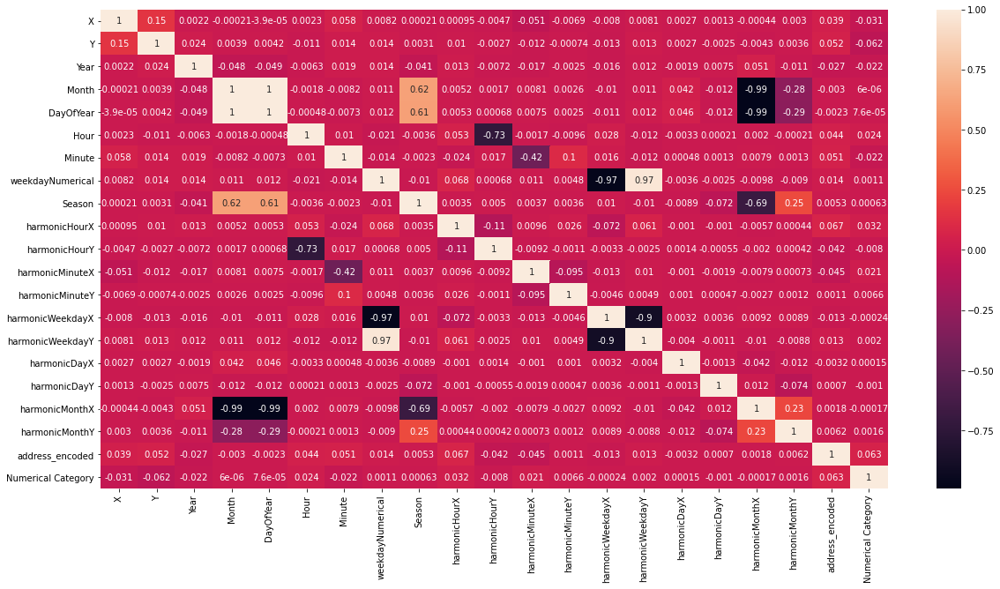

In [117]:
correlation_train_df = train_df
correlation_train_df['Numerical Category'] = ordinal_encoder.fit_transform(np.reshape(np.array(train_df['Category']), (-1, 1)))

plt.figure(figsize=(20, 10))
sns.heatmap(correlation_train_df.corr(), annot=True)
plt.show()

# Training best models and performing their cross-validation

In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss
from sklearn.model_selection import train_test_split
import joblib
import lightgbm as lgb
from sklearn.model_selection import cross_val_score

# supress all warnings, considering that they are not informative at the moment
import warnings
warnings.filterwarnings("ignore")

In [16]:
#  set all scalers and transformers 
#  note: if you want ordinal encoder to be able to encode unknown classes write in constructor:
# "handle_unknown='use_encoded_value', unknown_value=-1"
ordinal_encoder = OrdinalEncoder()
standard_scaler = StandardScaler()
minmax = MinMaxScaler()

**Important note:** amount of models will make it time consuming to perform cross-validation of the models and all of their versions. To reduce amount of time required to accomplish the task will be taken only classification models with the best results.

# Logistic Regression with SAGA solver and multinomial regression with applied minmax transformation and standardization of the data

In [34]:
log_model = LogisticRegression(multi_class='multinomial', solver='saga')

# make data standardization
x = train_df[numerical_columns]
x[['X', 'Y']] = minmax.fit_transform(x[['X', 'Y']])
x = standard_scaler.fit_transform(x)

y = train_df[target]
y = np.array(y)
y = np.reshape(y, (-1, 1))
y = ordinal_encoder.fit_transform(y)

# split data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10, stratify=y)
log_model.fit(x_train, y_train)

# show percentage of correct results
print('>>> log loss coefficient = ' + str(log_loss(y_test, log_model.predict_proba(x_test))))
# >>> log loss coefficient = 2.522534169330668

>>> log loss coefficient = 2.5225341687022653


In [37]:
joblib.dump(log_model, 'logistic_regression_saga_numerical_minmax_standard.pkl')

['logistic_regression_saga_numerical_minmax_standard.pkl']

Cross-validation accuracy scores: [-2.60556477 -2.56653197 -2.54302378 -2.52106539 -2.49762675         nan
         nan         nan         nan -2.59663761]


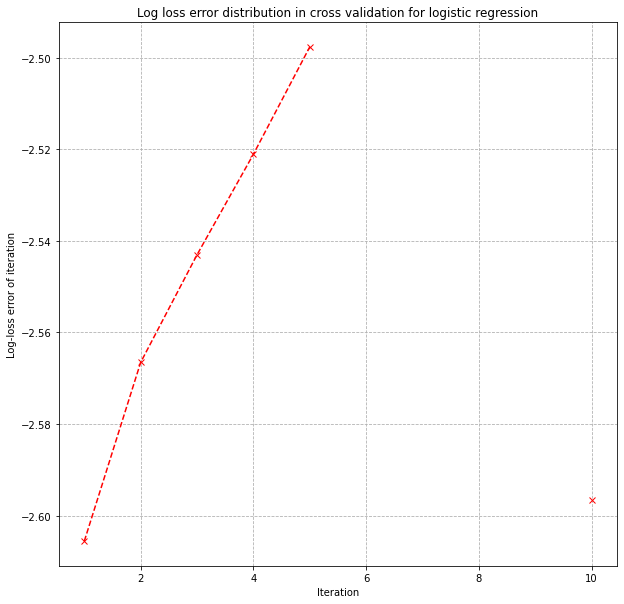

In [118]:
scores = cross_val_score(log_model, x, y, n_jobs=-1, cv=10, scoring='neg_log_loss')
print(f'Cross-validation accuracy scores: {scores}')

fig, ax = plt.subplots(figsize=(10, 10))

ax.plot(np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10]), scores, color='r', linestyle='--', marker='x')
ax.set_xlabel('Iteration')
ax.set_ylabel('Log-loss error of iteration')
ax.set_title('Log loss error distribution in cross validation for logistic regression')
ax.grid(True, linestyle='--')

plt.show()

# Random Forest Classifier (RFC) with 15-levels of depth, 700 estimators with minmax data transformation

In [56]:
rfc = RandomForestClassifier(max_depth = 15, min_samples_leaf = 6, max_features = 'auto', 
                             min_samples_split = 4, min_weight_fraction_leaf = 0.0, n_estimators = 700, 
                             n_jobs = -1, random_state = 42, verbose = 2)
    
x = train_df[numerical_columns]
x[['X', 'Y']] = minmax.fit_transform(x[['X', 'Y']])

y = train_df[target]
y = np.array(y)
y = np.reshape(y, (-1, 1))
y = ordinal_encoder.fit_transform(y)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10, stratify=y)
rfc.fit(x_train, y_train)

# show log loss
print('>>> log loss coefficient = ' + str(log_loss(y_test, rfc.predict_proba(x_test))))
# >>> log loss coefficient = 2.320314742290441

# current code execution out:
# [Parallel(n_jobs=-1)]: Done 700 out of 700 | elapsed: 13.2min finished

# RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
#                        criterion='gini', max_depth=15, max_features='auto',
#                        max_leaf_nodes=None, max_samples=None,
#                        min_impurity_decrease=0.0, min_impurity_split=None,
#                        min_samples_leaf=6, min_samples_split=4,
#                        min_weight_fraction_leaf=0.0, n_estimators=700,
#                        n_jobs=-1, oob_score=False, random_state=42, verbose=2,
#                        warm_start=False)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


building tree 1 of 700
building tree 2 of 700building tree 3 of 700

building tree 4 of 700
building tree 5 of 700
building tree 6 of 700
building tree 7 of 700
building tree 8 of 700
building tree 9 of 700
building tree 10 of 700
building tree 11 of 700
building tree 12 of 700
building tree 13 of 700
building tree 14 of 700
building tree 15 of 700
building tree 16 of 700
building tree 17 of 700building tree 18 of 700

building tree 19 of 700
building tree 20 of 700
building tree 21 of 700
building tree 22 of 700
building tree 23 of 700
building tree 24 of 700
building tree 25 of 700
building tree 26 of 700
building tree 27 of 700
building tree 28 of 700
building tree 29 of 700
building tree 30 of 700


[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    8.3s


building tree 31 of 700
building tree 32 of 700
building tree 33 of 700
building tree 34 of 700
building tree 35 of 700
building tree 36 of 700
building tree 37 of 700
building tree 38 of 700
building tree 39 of 700
building tree 40 of 700
building tree 41 of 700
building tree 42 of 700
building tree 43 of 700
building tree 44 of 700
building tree 45 of 700
building tree 46 of 700
building tree 47 of 700
building tree 48 of 700
building tree 49 of 700
building tree 50 of 700
building tree 51 of 700
building tree 52 of 700
building tree 53 of 700
building tree 54 of 700
building tree 55 of 700
building tree 56 of 700
building tree 57 of 700
building tree 58 of 700
building tree 59 of 700
building tree 60 of 700
building tree 61 of 700
building tree 62 of 700
building tree 63 of 700
building tree 64 of 700
building tree 65 of 700
building tree 66 of 700
building tree 67 of 700
building tree 68 of 700
building tree 69 of 700
building tree 70 of 700
building tree 71 of 700
building tree 72

[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   48.9s


building tree 152 of 700
building tree 153 of 700
building tree 154 of 700
building tree 155 of 700
building tree 156 of 700
building tree 157 of 700
building tree 158 of 700
building tree 159 of 700
building tree 160 of 700
building tree 161 of 700
building tree 162 of 700
building tree 163 of 700
building tree 164 of 700
building tree 165 of 700
building tree 166 of 700
building tree 167 of 700
building tree 168 of 700
building tree 169 of 700
building tree 170 of 700
building tree 171 of 700
building tree 172 of 700
building tree 173 of 700building tree 174 of 700

building tree 175 of 700
building tree 176 of 700
building tree 177 of 700
building tree 178 of 700
building tree 179 of 700
building tree 180 of 700
building tree 181 of 700
building tree 182 of 700
building tree 183 of 700
building tree 184 of 700
building tree 185 of 700
building tree 186 of 700
building tree 187 of 700
building tree 188 of 700
building tree 189 of 700
building tree 190 of 700
building tree 191 of 700


[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  2.0min


building tree 354 of 700
building tree 355 of 700
building tree 356 of 700
building tree 357 of 700
building tree 358 of 700
building tree 359 of 700
building tree 360 of 700
building tree 361 of 700
building tree 362 of 700
building tree 363 of 700
building tree 364 of 700
building tree 365 of 700
building tree 366 of 700
building tree 367 of 700
building tree 368 of 700
building tree 369 of 700
building tree 370 of 700
building tree 371 of 700
building tree 372 of 700
building tree 373 of 700
building tree 374 of 700
building tree 375 of 700
building tree 376 of 700
building tree 377 of 700
building tree 378 of 700
building tree 379 of 700
building tree 380 of 700
building tree 381 of 700
building tree 382 of 700
building tree 383 of 700
building tree 384 of 700
building tree 385 of 700
building tree 386 of 700
building tree 387 of 700
building tree 388 of 700
building tree 389 of 700
building tree 390 of 700
building tree 391 of 700
building tree 392 of 700
building tree 393 of 700


[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  3.5min


building tree 638 of 700
building tree 639 of 700
building tree 640 of 700
building tree 641 of 700
building tree 642 of 700
building tree 643 of 700
building tree 644 of 700
building tree 645 of 700
building tree 646 of 700
building tree 647 of 700
building tree 648 of 700
building tree 649 of 700
building tree 650 of 700
building tree 651 of 700
building tree 652 of 700
building tree 653 of 700
building tree 654 of 700
building tree 655 of 700
building tree 656 of 700
building tree 657 of 700
building tree 658 of 700
building tree 659 of 700
building tree 660 of 700
building tree 661 of 700
building tree 662 of 700
building tree 663 of 700
building tree 664 of 700
building tree 665 of 700
building tree 666 of 700
building tree 667 of 700
building tree 668 of 700
building tree 669 of 700
building tree 670 of 700
building tree 671 of 700
building tree 672 of 700
building tree 673 of 700
building tree 674 of 700
building tree 675 of 700
building tree 676 of 700building tree 677 of 700



[Parallel(n_jobs=-1)]: Done 700 out of 700 | elapsed:  3.9min finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    0.5s
[Parallel(n_jobs=12)]: Done 138 tasks      | elapsed:    3.2s
[Parallel(n_jobs=12)]: Done 341 tasks      | elapsed:    7.4s
[Parallel(n_jobs=12)]: Done 624 tasks      | elapsed:   13.3s
[Parallel(n_jobs=12)]: Done 700 out of 700 | elapsed:   14.9s finished


>>> log loss coefficient = 2.320314742290441


In [57]:
joblib.dump(rfc, 'random_forest_classifier_numerical_minmax_standard.pkl')

['random_forest_classifier_numerical_minmax_standard.pkl']

In [58]:
scores = cross_val_score(rfc, x, y, n_jobs=-1, cv=10, scoring='neg_log_loss')
print(f'Cross-validation accuracy scores: {scores}')

Cross-validation accuracy scores: [-2.81650287 -2.66933497 -2.54591859 -2.47040104 -2.50650423         nan
         nan         nan         nan -2.81923401]


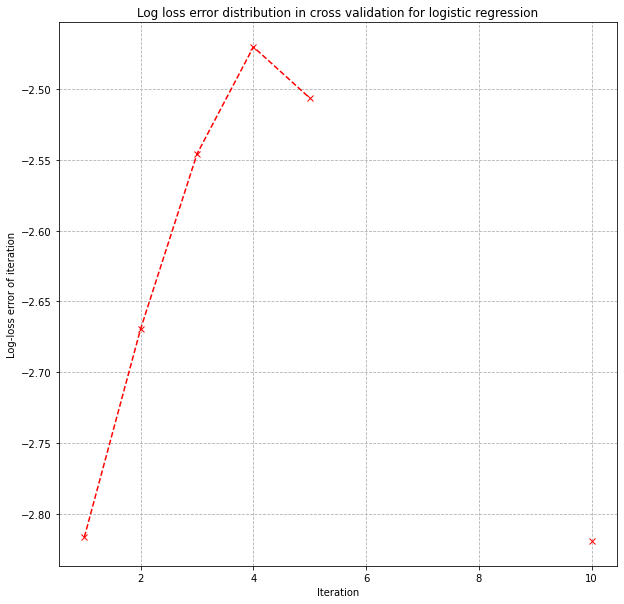

In [59]:
fig, ax = plt.subplots(figsize=(10, 10))

ax.plot(np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10]), scores, color='r', linestyle='--', marker='x')
ax.set_xlabel('Iteration')
ax.set_ylabel('Log-loss error of iteration')
ax.set_title('Log loss error distribution in cross validation for logistic regression')
ax.grid(True, linestyle='--')

plt.show()

# LightGBM over numerical data with performed minmax scale and standardization

In [79]:
x = train_df[numerical_columns]
x[['X', 'Y']] = minmax.fit_transform(x[['X', 'Y']])
x = standard_scaler.fit_transform(x)

y = train_df[target]
y = np.array(y)
y = np.reshape(y, (-1, 1))
y = ordinal_encoder.fit_transform(y)
# y = y.flat

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10, stratify=y)
train_data = lgb.Dataset(x_train, label=y_train)

parameters = {'num_class': 39, 'objective': 'multiclass', 'metric': 'multi_logloss',
              'device': 'CPU', 'boosting_type': 'gbdt', 'learning_rate': 0.01,
              'verbose': 0, 'gpu_platform_id': 1, 'gpu_device_id': 1}
num_rounds = 1500
# lgb_st_model = lgb.train(parameters, train_data, num_rounds)

# preds = lgb_st_model.predict(x_test)
# print('>>> log loss coefficient = ' + str(log_loss(y_test, preds)))
# >>> log loss coefficient = 2.2619404221465667

In [32]:
joblib.dump(lgb_st_model, 'lightGBM_minmax_standard.pkl')

['lightGBM_minmax_standard.pkl']

In [87]:
result = lgb.cv(params=parameters, train_set=lgb.Dataset(x, label=y), nfold=10, shuffle=True)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force

In [88]:
print(result['multi_logloss-mean'])

[2.667643400693545, 2.6584843444952333, 2.6503192405838742, 2.642759415406597, 2.6356413741648934, 2.628929592827203, 2.622572501668449, 2.6164618249332072, 2.610588818227032, 2.604866229328034, 2.599366241651474, 2.594070348986453, 2.5889472840627326, 2.5840042293611925, 2.5792192313067615, 2.5745653480744677, 2.5700556706503868, 2.5656578312227407, 2.5612975559474718, 2.557087478440087, 2.5530058977216283, 2.5490203521025956, 2.545159532098898, 2.5413958947345074, 2.5377460967958645, 2.5341902027402723, 2.5307020678181855, 2.527278050488284, 2.5239797926612337, 2.520720862144617, 2.51755771160906, 2.51447996124004, 2.511452554607107, 2.5084936671579787, 2.505609035761027, 2.5027839550863265, 2.500027865424615, 2.497320420900195, 2.4946797118558104, 2.492075172515725, 2.4895308145642714, 2.4870341573902017, 2.4845952904255997, 2.482200122050037, 2.479863567006077, 2.4775636883490293, 2.475308300848705, 2.4730573783041696, 2.4708810362713054, 2.468739302514913, 2.4666430965470285, 2.46

In [97]:
multi_logloss_mean_array = [2.667643400693545, 2.6584843444952333, 2.6503192405838742, 2.642759415406597, 2.6356413741648934, 
                            2.628929592827203, 2.622572501668449, 2.6164618249332072, 2.610588818227032, 2.604866229328034, 
                            2.599366241651474, 2.594070348986453, 2.5889472840627326, 2.5840042293611925, 2.5792192313067615, 
                            2.5745653480744677, 2.5700556706503868, 2.5656578312227407, 2.5612975559474718, 2.557087478440087, 
                            2.5530058977216283, 2.5490203521025956, 2.545159532098898, 2.5413958947345074, 2.5377460967958645, 
                            2.5341902027402723, 2.5307020678181855, 2.527278050488284, 2.5239797926612337, 2.520720862144617, 
                            2.51755771160906, 2.51447996124004, 2.511452554607107, 2.5084936671579787, 2.505609035761027, 
                            2.5027839550863265, 2.500027865424615, 2.497320420900195, 2.4946797118558104, 2.492075172515725, 
                            2.4895308145642714, 2.4870341573902017, 2.4845952904255997, 2.482200122050037, 2.479863567006077, 
                            2.4775636883490293, 2.475308300848705, 2.4730573783041696, 2.4708810362713054, 2.468739302514913, 
                            2.4666430965470285, 2.4645721457281278, 2.4625432248573587, 2.4605605999499245, 2.4585908024553764, 
                            2.456645434123673, 2.454742404249976, 2.4528783666264564, 2.451020450966094, 2.4491985255429567, 
                            2.447424528183668, 2.4456607695703356, 2.443937789499857, 2.442244088270427, 2.4405839216348406, 
                            2.4389532322659733, 2.4373367814691647, 2.4357622198487925, 2.4342232868412363, 2.432702102706945, 
                            2.431199839946459, 2.4297115442734016, 2.4282690684299046, 2.426811137261277, 2.4253819288184912, 
                            2.4239857649516265, 2.4226102913888914, 2.4212405638963164, 2.4198812329948725, 2.4185739810853177, 
                            2.4172579199334203, 2.4159659035298073, 2.4146756722665357, 2.413434755222248, 2.412186054746048, 
                            2.4109480275997717, 2.4097409873811104, 2.408542954204546, 2.407353011050844, 2.406202305781031, 
                            2.4050561184170496, 2.4039123816548833, 2.4028050428066217, 2.4017042375176985, 2.4006249276926512, 
                            2.3995579457622602, 2.3985085036129212, 2.397456352691743, 2.3964482432975114, 2.3954466930426297]

print(len(multi_logloss_mean_array))

100


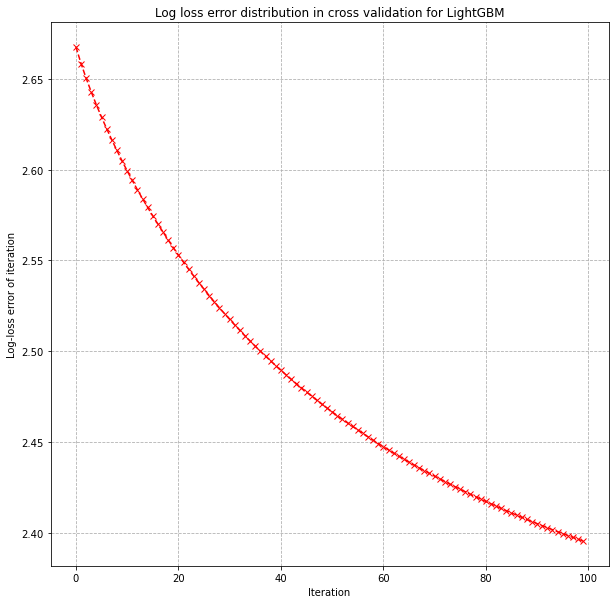

In [99]:
fig, ax = plt.subplots(figsize=(10, 10))

ax.plot(np.array([i for i in range(0, 100)]), multi_logloss_mean_array, color='r', linestyle='--', marker='x')
ax.set_xlabel('Iteration')
ax.set_ylabel('Log-loss error of iteration')
ax.set_title('Log loss error distribution in cross validation for LightGBM')
ax.grid(True, linestyle='--')

plt.show()

# KNN with Manhattan distance estimation, minmax data scale, standardization of the data, only numerical data

In [16]:
knn_man_st = KNeighborsClassifier(n_neighbors=2000, metric='manhattan')

x = train_df[numerical_columns]
x[['X', 'Y']] = minmax.fit_transform(x[['X', 'Y']])
x = standard_scaler.fit_transform(x)

y = train_df[target]
y = np.array(y)
y = np.reshape(y, (-1, 1))
y = ordinal_encoder.fit_transform(y)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10, stratify=y)

knn_man_st.fit(x_train, y_train)

man_st_predictions = knn_man_st.predict_proba(x_test)

print('>>> log loss coefficient = ' + str(log_loss(y_test, man_st_predictions)))
# >>> log loss coefficient = 2.55 (this was with 1000 neighbors)

>>> log loss coefficient = 2.537254544744978


In [29]:
joblib.dump(knn_man_st, 'knn_numerical_minmax_standard.pkl')

['knn_numerical_minmax_standard.pkl']

# CatBoost

In [18]:
import catboost

In [25]:
cb = catboost.CatBoostClassifier(l2_leaf_reg = 5, 
                                learning_rate = 0.01, 
                                logging_level = 'Verbose', 
                                iterations = 10000, 
                                depth = 6, 
                                random_seed = 42,
                                loss_function = 'MultiClass',
                                task_type = 'GPU')

# input
x = train_df[numerical_columns]
x[['X', 'Y']] = minmax.fit_transform(x[['X', 'Y']])


# take elements that model must find
y = train_df[target]
y = np.array(y)
y = np.reshape(y, (-1, 1))

# # input for testing
# x_test = test_df[numerical_columns]
# x_test[['X', 'Y']] = minmax.transform(x_test[['X', 'Y']])

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10, stratify=y)

print(">>> starting fit process")
cb.fit(x_train, y_train)
print('>>> finished fit')

>>> starting fit process
0:	learn: 3.6237329	total: 265ms	remaining: 44m 11s
1:	learn: 3.5871244	total: 518ms	remaining: 43m 11s
2:	learn: 3.5534226	total: 773ms	remaining: 42m 57s
3:	learn: 3.5221244	total: 1.03s	remaining: 43m
4:	learn: 3.4929717	total: 1.29s	remaining: 42m 59s
5:	learn: 3.4655620	total: 1.55s	remaining: 42m 58s
6:	learn: 3.4395559	total: 1.8s	remaining: 42m 51s
7:	learn: 3.4150786	total: 2.06s	remaining: 42m 50s
8:	learn: 3.3915920	total: 2.31s	remaining: 42m 47s
9:	learn: 3.3694490	total: 2.58s	remaining: 42m 56s
10:	learn: 3.3481472	total: 2.83s	remaining: 42m 53s
11:	learn: 3.3280066	total: 3.1s	remaining: 42m 56s
12:	learn: 3.3086191	total: 3.35s	remaining: 42m 54s
13:	learn: 3.2900074	total: 3.61s	remaining: 42m 52s
14:	learn: 3.2720116	total: 3.86s	remaining: 42m 48s
15:	learn: 3.2548278	total: 4.11s	remaining: 42m 44s
16:	learn: 3.2381232	total: 4.36s	remaining: 42m 39s
17:	learn: 3.2219247	total: 4.61s	remaining: 42m 36s
18:	learn: 3.2064903	total: 4.87s	rem

In [26]:
# probabilities
print('>>> start predict')
nonst_probs = cb.predict_proba(x_test)
print(nonst_probs)
print('>>> finished predict')
nonst_probs
# print('>>> log loss coefficient = ' + str(log_loss(y_test, nonst_probs)))

# joblib.dump(cb, 'catboost_numerical_minmaxXY.pkl')

>>> start predict
[[3.62170003e-03 1.37881678e-01 7.04330080e-06 ... 1.47568191e-02
  8.02483354e-02 1.36823160e-02]
 [1.14921758e-03 7.54006352e-02 2.39625115e-04 ... 3.26362883e-02
  3.56192497e-02 4.89697029e-03]
 [9.12036767e-05 2.66246402e-02 8.08701534e-04 ... 6.38714010e-02
  1.09370709e-02 7.15417549e-04]
 ...
 [1.67819518e-03 5.71597299e-02 6.67899223e-06 ... 1.47512971e-02
  5.94144529e-02 1.95313343e-02]
 [6.13722099e-04 5.53909950e-02 5.93386121e-04 ... 1.62324328e-02
  1.55957153e-01 1.16906792e-02]
 [1.29991111e-03 5.30701544e-02 2.71138893e-04 ... 1.32045122e-01
  1.15438931e-02 2.60815950e-03]]
>>> finished predict


array([[3.62170003e-03, 1.37881678e-01, 7.04330080e-06, ...,
        1.47568191e-02, 8.02483354e-02, 1.36823160e-02],
       [1.14921758e-03, 7.54006352e-02, 2.39625115e-04, ...,
        3.26362883e-02, 3.56192497e-02, 4.89697029e-03],
       [9.12036767e-05, 2.66246402e-02, 8.08701534e-04, ...,
        6.38714010e-02, 1.09370709e-02, 7.15417549e-04],
       ...,
       [1.67819518e-03, 5.71597299e-02, 6.67899223e-06, ...,
        1.47512971e-02, 5.94144529e-02, 1.95313343e-02],
       [6.13722099e-04, 5.53909950e-02, 5.93386121e-04, ...,
        1.62324328e-02, 1.55957153e-01, 1.16906792e-02],
       [1.29991111e-03, 5.30701544e-02, 2.71138893e-04, ...,
        1.32045122e-01, 1.15438931e-02, 2.60815950e-03]])

In [28]:
print('>>> log8 loss coefficient = ' + str(log_loss(y_test, nonst_probs)))
joblib.dump(cb, 'catboost_numerical_minmaxXY.pkl')

>>> log8 loss coefficient = 2.2599904292729467


['catboost_numerical_minmaxXY.pkl']

In [93]:
params = {
    "l2_leaf_reg": 5, 
    "learning_rate": 0.01, 
    "logging_level": 'Verbose', 
    "iterations": 10000, 
    "depth": 6, 
    "random_seed": 42,
    "loss_function": 'MultiClass',
    "task_type": 'GPU'
}

result = catboost.cv(catboost.Pool(x, label=y), params, fold_count=10, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/10]


0:	learn: 3.6236270	test: 3.6236573	best: 3.6236573 (0)	total: 323ms	remaining: 53m 54s
1:	learn: 3.5869625	test: 3.5870280	best: 3.5870280 (1)	total: 626ms	remaining: 52m 7s
2:	learn: 3.5531483	test: 3.5532279	best: 3.5532279 (2)	total: 1.1s	remaining: 1h 1m 18s
3:	learn: 3.5218259	test: 3.5219276	best: 3.5219276 (3)	total: 1.44s	remaining: 59m 54s
4:	learn: 3.4925927	test: 3.4926907	best: 3.4926907 (4)	total: 1.77s	remaining: 58m 59s
5:	learn: 3.4651808	test: 3.4652782	best: 3.4652782 (5)	total: 2.1s	remaining: 58m 25s
6:	learn: 3.4391313	test: 3.4392027	best: 3.4392027 (6)	total: 2.42s	remaining: 57m 41s
7:	learn: 3.4146426	test: 3.4147129	best: 3.4147129 (7)	total: 2.75s	remaining: 57m 19s
8:	learn: 3.3911526	test: 3.3912218	best: 3.3912218 (8)	total: 3.07s	remaining: 56m 51s
9:	learn: 3.3689949	test: 3.3690505	best: 3.3690505 (9)	total: 3.42s	remaining: 56m 58s
10:	learn: 3.3476877	test: 3.3477492	best: 3.3477492 (10)	total: 3.73s	remaining: 56m 27s
11:	learn: 3.3275428	test: 3.32

0:	learn: 3.6235701	test: 3.6237575	best: 3.6237575 (0)	total: 267ms	remaining: 44m 32s
1:	learn: 3.5867982	test: 3.5871338	best: 3.5871338 (1)	total: 541ms	remaining: 45m 5s
2:	learn: 3.5530009	test: 3.5534727	best: 3.5534727 (2)	total: 806ms	remaining: 44m 46s
3:	learn: 3.5215907	test: 3.5221824	best: 3.5221824 (3)	total: 1.1s	remaining: 46m
4:	learn: 3.4923568	test: 3.4930530	best: 3.4930530 (4)	total: 1.37s	remaining: 45m 43s
5:	learn: 3.4649030	test: 3.4656817	best: 3.4656817 (5)	total: 1.64s	remaining: 45m 32s
6:	learn: 3.4388661	test: 3.4397423	best: 3.4397423 (6)	total: 1.9s	remaining: 45m 19s
7:	learn: 3.4143591	test: 3.4153076	best: 3.4153076 (7)	total: 2.17s	remaining: 45m 11s
8:	learn: 3.3908526	test: 3.3918682	best: 3.3918682 (8)	total: 2.44s	remaining: 45m 7s
9:	learn: 3.3686908	test: 3.3697686	best: 3.3697686 (9)	total: 2.7s	remaining: 45m 1s
10:	learn: 3.3473390	test: 3.3484708	best: 3.3484708 (10)	total: 2.97s	remaining: 44m 57s
11:	learn: 3.3271881	test: 3.3283616	bes

0:	learn: 3.6236680	test: 3.6235237	best: 3.6235237 (0)	total: 269ms	remaining: 44m 46s
1:	learn: 3.5870267	test: 3.5867626	best: 3.5867626 (1)	total: 534ms	remaining: 44m 28s
2:	learn: 3.5532756	test: 3.5529312	best: 3.5529312 (2)	total: 800ms	remaining: 44m 25s
3:	learn: 3.5219548	test: 3.5215442	best: 3.5215442 (3)	total: 1.13s	remaining: 47m 5s
4:	learn: 3.4927495	test: 3.4922536	best: 3.4922536 (4)	total: 1.4s	remaining: 46m 31s
5:	learn: 3.4653137	test: 3.4647376	best: 3.4647376 (5)	total: 1.66s	remaining: 46m 13s
6:	learn: 3.4392899	test: 3.4386597	best: 3.4386597 (6)	total: 1.93s	remaining: 45m 56s
7:	learn: 3.4148094	test: 3.4141152	best: 3.4141152 (7)	total: 2.2s	remaining: 45m 43s
8:	learn: 3.3912987	test: 3.3905834	best: 3.3905834 (8)	total: 2.46s	remaining: 45m 33s
9:	learn: 3.3691475	test: 3.3683741	best: 3.3683741 (9)	total: 2.73s	remaining: 45m 26s
10:	learn: 3.3478424	test: 3.3470401	best: 3.3470401 (10)	total: 2.99s	remaining: 45m 17s
11:	learn: 3.3276927	test: 3.3268

0:	learn: 3.6235888	test: 3.6239195	best: 3.6239195 (0)	total: 279ms	remaining: 46m 27s
1:	learn: 3.5869143	test: 3.5874976	best: 3.5874976 (1)	total: 546ms	remaining: 45m 31s
2:	learn: 3.5530903	test: 3.5538789	best: 3.5538789 (2)	total: 811ms	remaining: 45m 3s
3:	learn: 3.5217016	test: 3.5226817	best: 3.5226817 (3)	total: 1.08s	remaining: 44m 52s
4:	learn: 3.4924735	test: 3.4936599	best: 3.4936599 (4)	total: 1.34s	remaining: 44m 44s
5:	learn: 3.4650238	test: 3.4663902	best: 3.4663902 (5)	total: 1.61s	remaining: 44m 43s
6:	learn: 3.4390051	test: 3.4405022	best: 3.4405022 (6)	total: 1.87s	remaining: 44m 33s
7:	learn: 3.4144891	test: 3.4161369	best: 3.4161369 (7)	total: 2.14s	remaining: 44m 32s
8:	learn: 3.3910079	test: 3.3927686	best: 3.3927686 (8)	total: 2.4s	remaining: 44m 30s
9:	learn: 3.3688371	test: 3.3707403	best: 3.3707403 (9)	total: 2.67s	remaining: 44m 28s
10:	learn: 3.3475038	test: 3.3495046	best: 3.3495046 (10)	total: 2.94s	remaining: 44m 26s
11:	learn: 3.3273474	test: 3.329

0:	learn: 3.6236298	test: 3.6236061	best: 3.6236061 (0)	total: 267ms	remaining: 44m 26s
1:	learn: 3.5869445	test: 3.5869240	best: 3.5869240 (1)	total: 532ms	remaining: 44m 18s
2:	learn: 3.5532027	test: 3.5531789	best: 3.5531789 (2)	total: 797ms	remaining: 44m 15s
3:	learn: 3.5218253	test: 3.5218357	best: 3.5218357 (3)	total: 1.06s	remaining: 44m 20s
4:	learn: 3.4926166	test: 3.4926259	best: 3.4926259 (4)	total: 1.33s	remaining: 44m 20s
5:	learn: 3.4651867	test: 3.4652153	best: 3.4652153 (5)	total: 1.6s	remaining: 44m 23s
6:	learn: 3.4391582	test: 3.4392015	best: 3.4392015 (6)	total: 1.86s	remaining: 44m 18s
7:	learn: 3.4146568	test: 3.4147147	best: 3.4147147 (7)	total: 2.13s	remaining: 44m 17s
8:	learn: 3.3914488	test: 3.3915278	best: 3.3915278 (8)	total: 2.46s	remaining: 45m 26s
9:	learn: 3.3693171	test: 3.3694120	best: 3.3694120 (9)	total: 2.72s	remaining: 45m 18s
10:	learn: 3.3479350	test: 3.3480655	best: 3.3480655 (10)	total: 2.98s	remaining: 45m 10s
11:	learn: 3.3277974	test: 3.32

0:	learn: 3.6236312	test: 3.6236300	best: 3.6236300 (0)	total: 266ms	remaining: 44m 16s
1:	learn: 3.5869098	test: 3.5869668	best: 3.5869668 (1)	total: 532ms	remaining: 44m 17s
2:	learn: 3.5531392	test: 3.5532491	best: 3.5532491 (2)	total: 797ms	remaining: 44m 15s
3:	learn: 3.5217935	test: 3.5219234	best: 3.5219234 (3)	total: 1.1s	remaining: 45m 46s
4:	learn: 3.4925541	test: 3.4926658	best: 3.4926658 (4)	total: 1.36s	remaining: 45m 28s
5:	learn: 3.4651401	test: 3.4652328	best: 3.4652328 (5)	total: 1.63s	remaining: 45m 19s
6:	learn: 3.4391218	test: 3.4392186	best: 3.4392186 (6)	total: 1.9s	remaining: 45m 16s
7:	learn: 3.4146376	test: 3.4147219	best: 3.4147219 (7)	total: 2.17s	remaining: 45m 8s
8:	learn: 3.3911733	test: 3.3912793	best: 3.3912793 (8)	total: 2.43s	remaining: 45m
9:	learn: 3.3689953	test: 3.3690900	best: 3.3690900 (9)	total: 2.7s	remaining: 44m 57s
10:	learn: 3.3476703	test: 3.3477922	best: 3.3477922 (10)	total: 2.96s	remaining: 44m 51s
11:	learn: 3.3275175	test: 3.3276299	b

0:	learn: 3.6236407	test: 3.6235907	best: 3.6235907 (0)	total: 268ms	remaining: 44m 35s
1:	learn: 3.5869529	test: 3.5868257	best: 3.5868257 (1)	total: 534ms	remaining: 44m 30s
2:	learn: 3.5532032	test: 3.5530026	best: 3.5530026 (2)	total: 801ms	remaining: 44m 28s
3:	learn: 3.5218898	test: 3.5216448	best: 3.5216448 (3)	total: 1.06s	remaining: 44m 22s
4:	learn: 3.4926852	test: 3.4924287	best: 3.4924287 (4)	total: 1.33s	remaining: 44m 25s
5:	learn: 3.4652599	test: 3.4649902	best: 3.4649902 (5)	total: 1.6s	remaining: 44m 26s
6:	learn: 3.4392209	test: 3.4389450	best: 3.4389450 (6)	total: 1.86s	remaining: 44m 21s
7:	learn: 3.4147325	test: 3.4144527	best: 3.4144527 (7)	total: 2.13s	remaining: 44m 20s
8:	learn: 3.3912896	test: 3.3909860	best: 3.3909860 (8)	total: 2.39s	remaining: 44m 18s
9:	learn: 3.3691181	test: 3.3688116	best: 3.3688116 (9)	total: 2.66s	remaining: 44m 18s
10:	learn: 3.3478244	test: 3.3474973	best: 3.3474973 (10)	total: 2.94s	remaining: 44m 34s
11:	learn: 3.3276679	test: 3.32

0:	learn: 3.6236279	test: 3.6237490	best: 3.6237490 (0)	total: 266ms	remaining: 44m 16s
1:	learn: 3.5869106	test: 3.5870896	best: 3.5870896 (1)	total: 530ms	remaining: 44m 10s
2:	learn: 3.5531561	test: 3.5533862	best: 3.5533862 (2)	total: 860ms	remaining: 47m 46s
3:	learn: 3.5217963	test: 3.5220648	best: 3.5220648 (3)	total: 1.16s	remaining: 48m 16s
4:	learn: 3.4925736	test: 3.4929242	best: 3.4929242 (4)	total: 1.43s	remaining: 47m 35s
5:	learn: 3.4651483	test: 3.4655695	best: 3.4655695 (5)	total: 1.7s	remaining: 47m 7s
6:	learn: 3.4391282	test: 3.4396083	best: 3.4396083 (6)	total: 1.96s	remaining: 46m 38s
7:	learn: 3.4146209	test: 3.4151693	best: 3.4151693 (7)	total: 2.23s	remaining: 46m 19s
8:	learn: 3.3911462	test: 3.3917179	best: 3.3917179 (8)	total: 2.49s	remaining: 46m 5s
9:	learn: 3.3689921	test: 3.3696177	best: 3.3696177 (9)	total: 2.77s	remaining: 46m 2s
10:	learn: 3.3476731	test: 3.3483253	best: 3.3483253 (10)	total: 3.03s	remaining: 45m 50s
11:	learn: 3.3275346	test: 3.32821

0:	learn: 3.6236599	test: 3.6234987	best: 3.6234987 (0)	total: 268ms	remaining: 44m 37s
1:	learn: 3.5870440	test: 3.5867288	best: 3.5867288 (1)	total: 533ms	remaining: 44m 22s
2:	learn: 3.5533471	test: 3.5528914	best: 3.5528914 (2)	total: 797ms	remaining: 44m 17s
3:	learn: 3.5220021	test: 3.5214123	best: 3.5214123 (3)	total: 1.08s	remaining: 44m 58s
4:	learn: 3.4928201	test: 3.4921490	best: 3.4921490 (4)	total: 1.35s	remaining: 45m 5s
5:	learn: 3.4653962	test: 3.4646428	best: 3.4646428 (5)	total: 1.62s	remaining: 45m 3s
6:	learn: 3.4393471	test: 3.4385476	best: 3.4385476 (6)	total: 1.89s	remaining: 44m 51s
7:	learn: 3.4148672	test: 3.4140118	best: 3.4140118 (7)	total: 2.15s	remaining: 44m 45s
8:	learn: 3.3914075	test: 3.3904651	best: 3.3904651 (8)	total: 2.41s	remaining: 44m 38s
9:	learn: 3.3692500	test: 3.3682676	best: 3.3682676 (9)	total: 2.68s	remaining: 44m 35s
10:	learn: 3.3479493	test: 3.3468849	best: 3.3468849 (10)	total: 2.94s	remaining: 44m 31s
11:	learn: 3.3278457	test: 3.326

0:	learn: 3.6236499	test: 3.6236075	best: 3.6236075 (0)	total: 268ms	remaining: 44m 34s
1:	learn: 3.5869627	test: 3.5869032	best: 3.5869032 (1)	total: 533ms	remaining: 44m 22s
2:	learn: 3.5532372	test: 3.5531384	best: 3.5531384 (2)	total: 835ms	remaining: 46m 22s
3:	learn: 3.5219051	test: 3.5217802	best: 3.5217802 (3)	total: 1.1s	remaining: 45m 45s
4:	learn: 3.4927063	test: 3.4925463	best: 3.4925463 (4)	total: 1.37s	remaining: 45m 36s
5:	learn: 3.4652715	test: 3.4650840	best: 3.4650840 (5)	total: 1.64s	remaining: 45m 26s
6:	learn: 3.4392474	test: 3.4390303	best: 3.4390303 (6)	total: 1.9s	remaining: 45m 13s
7:	learn: 3.4147563	test: 3.4145097	best: 3.4145097 (7)	total: 2.17s	remaining: 45m 4s
8:	learn: 3.3912641	test: 3.3909882	best: 3.3909882 (8)	total: 2.43s	remaining: 44m 56s
9:	learn: 3.3691195	test: 3.3688246	best: 3.3688246 (9)	total: 2.69s	remaining: 44m 52s
10:	learn: 3.3478076	test: 3.3474924	best: 3.3474924 (10)	total: 2.96s	remaining: 44m 47s
11:	learn: 3.3276658	test: 3.3273

In [100]:
result

,iterations,test-MultiClass-mean,test-MultiClass-std,train-MultiClass-mean,train-MultiClass-std
0,0,3.623654,0.000125,3.623629,0.000030
1,1,3.586986,0.000223,3.586943,0.000068
2,2,3.553236,0.000293,3.553180,0.000097
3,3,3.521900,0.000360,3.521829,0.000120
4,4,3.492700,0.000435,3.492613,0.000136
...,...,...,...,...,...
9995,9995,2.256575,0.003484,2.186100,0.000458
9996,9996,2.256573,0.003483,2.186090,0.000457
9997,9997,2.256568,0.003482,2.186078,0.000457
9998,9998,2.256564,0.003483,2.186069,0.000457


In [96]:
import pickle
filehandler = open('catboost_cross_val_result.pkl', 'wb')
pickle.dump(result, filehandler)

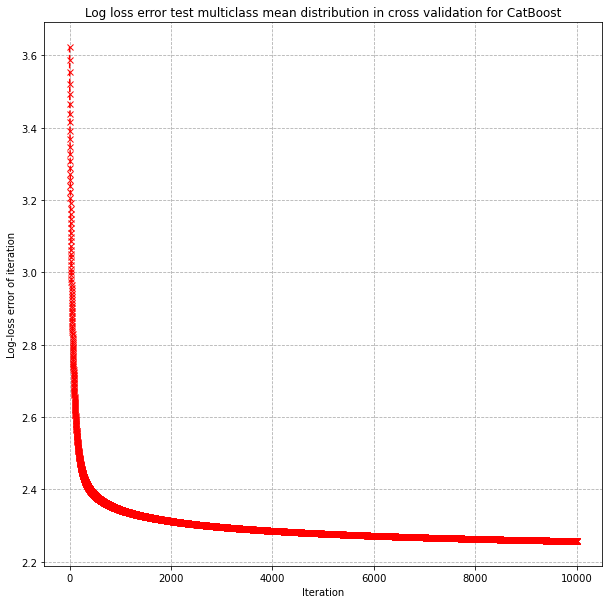

In [103]:
fig, ax = plt.subplots(figsize=(10, 10))

ax.plot(result.iterations, result['test-MultiClass-mean'], color='r', linestyle='--', marker='x')
ax.set_xlabel('Iteration')
ax.set_ylabel('Log-loss error of iteration')
ax.set_title('Log loss error test multiclass mean distribution in cross validation for CatBoost')
ax.grid(True, linestyle='--')

plt.show()

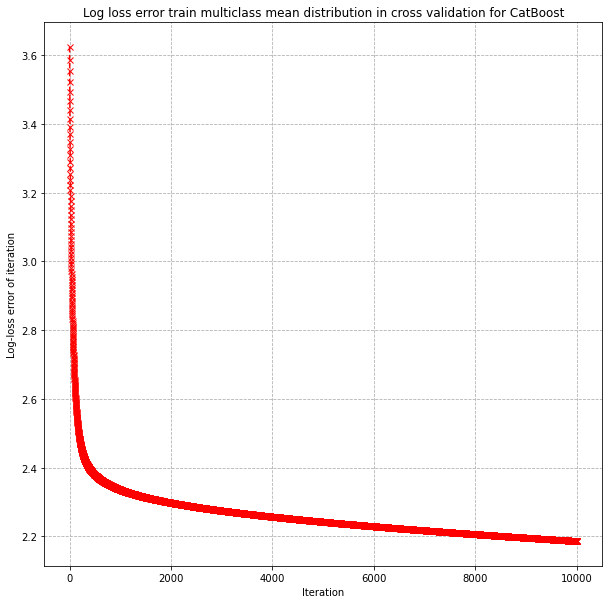

In [104]:
fig, ax = plt.subplots(figsize=(10, 10))

ax.plot(result.iterations, result['train-MultiClass-mean'], color='r', linestyle='--', marker='x')
ax.set_xlabel('Iteration')
ax.set_ylabel('Log-loss error of iteration')
ax.set_title('Log loss error train multiclass mean distribution in cross validation for CatBoost')
ax.grid(True, linestyle='--')

plt.show()

In [17]:
# input
x = train_df[numerical_columns]
x[['X', 'Y']] = minmax.fit_transform(x[['X', 'Y']])


# take elements that model must find
y = train_df[target]
y = np.array(y)
y = np.reshape(y, (-1, 1))

# # input for testing
# x_test = test_df[numerical_columns]
# x_test[['X', 'Y']] = minmax.transform(x_test[['X', 'Y']])

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10, stratify=y)

import pickle
cb = pickle.load(open('catboost_numerical_minmaxXY.pkl', 'rb'))
predictions = cb.predict(x_test)

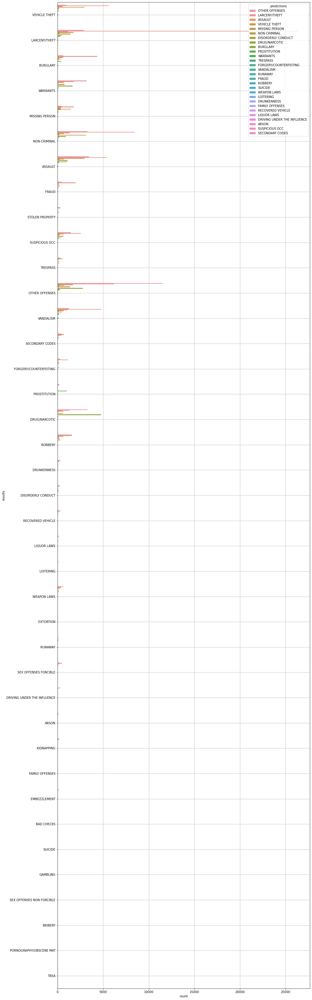

In [22]:
original_df = x_test
original_df['results'] = np.array(y_test)
original_df['predictions'] = np.array(predictions)

plt.figure(figsize=(15, 60))
sns.countplot(data=original_df, y="results", hue="predictions")
plt.grid()
plt.show()

In [23]:
x = train_df[numerical_columns]
x[['X', 'Y']] = minmax.fit_transform(x[['X', 'Y']])
x = standard_scaler.fit_transform(x)

y = train_df[target]
y = np.array(y)
y = np.reshape(y, (-1, 1))
y = ordinal_encoder.fit_transform(y)
# y = y.flat

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=10, stratify=y)
train_data = lgb.Dataset(x_train, label=y_train)

import pickle
lgb = pickle.load(open('lightGBM_minmax_standard.pkl', 'rb'))
predictions = lgb.predict(x_test)

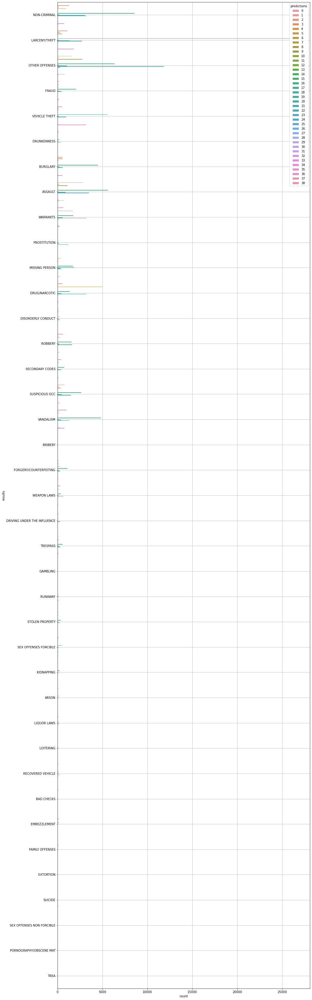

In [79]:
# np.reshape([element.argmax() for element in predictions], (1, -1))[0]
# y_test
# np.reshape(np.array(y_test), (1, -1))[0]
# y_test = ordinal_encoder.inverse_transform(np.reshape(np.array(y_test), (1, -1))[0])
# predictions = ordinal_encoder.inverse_transform(np.reshape([element.argmax() for element in predictions], (1, -1))[0])
original_df = pd.DataFrame(data={'results': np.reshape(np.array(y_test), (1, -1))[0], 'predictions': np.reshape([element.argmax() for element in predictions], (1, -1))[0], 'index': [i for i in range(0, len(y_test))]})
# # original_df
# original_df['predictions'] = np.array(predictions)

plt.figure(figsize=(15, 60))
sns.countplot(data=original_df, y="results", hue="predictions")
plt.grid()
plt.show()